In [ ]:
! pip install --upgrade scipy

In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from tqdm import tqdm

In [2]:
from fuzzylib import *

### Fuzzy Classes

In [3]:
%%time
r1 = FuzzyColor((255, 255, 255))

CPU times: user 1.41 ms, sys: 33 µs, total: 1.44 ms
Wall time: 1.51 ms


CPU times: user 30.4 ms, sys: 4.47 ms, total: 34.9 ms
Wall time: 33.7 ms


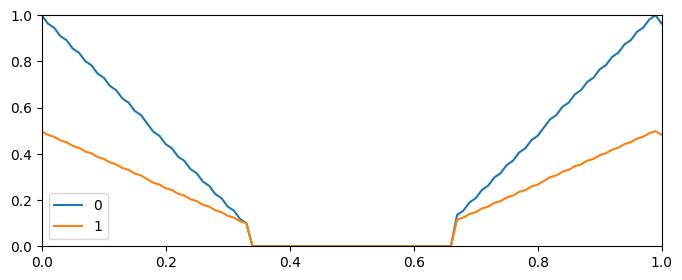

In [4]:
%%time
r1 = FuzzyColor((255, 0, 0))
r2 = FuzzyColor((127, 0, 0))
show(r1, r2)

{'r': 255, 'g': 26, 'b': 250}

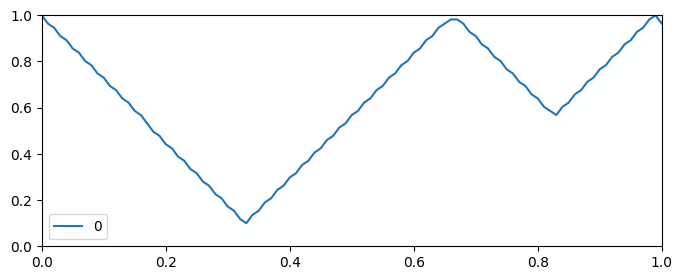

In [5]:
red_and_blue = FuzzyColor((255, 0, 255), tri_min)
red_and_blue.plot()
red_and_blue

({'r': 200, 'g': 26, 'b': 0},
 {'r': 26, 'g': 197, 'b': 29},
 {'r': 206, 'g': 198, 'b': 29})

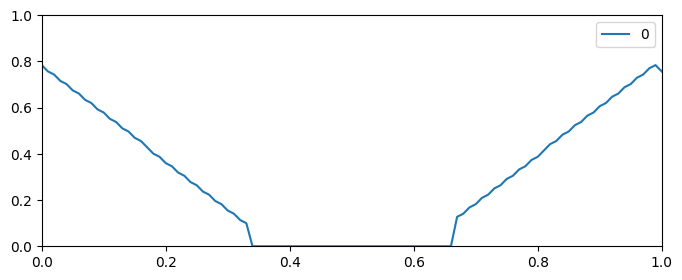

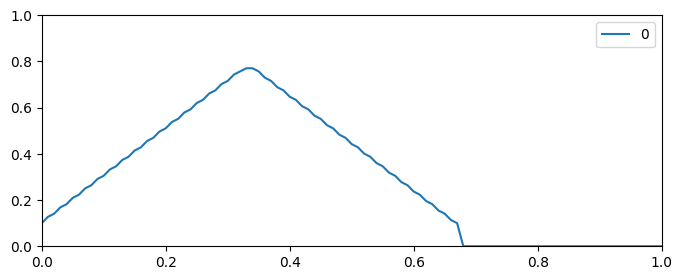

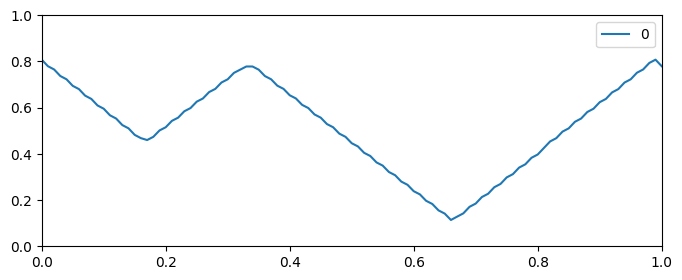

In [6]:
red = FuzzyColor((200, 0, 0), tri_min)
green = FuzzyColor((0, 200, 0), tri_min)
red_green = red + green
red.plot()
green.plot()
red_green.plot()
(red, green, red_green)

#### Fuzzy Image

#### Test fuzzy algo

In [7]:
from multiprocessing import Pool
def test_and_compare_parallel(tests, max_h, noise_level, conorm_fn, cores=2):
    per_core = round(len(tests)/cores + 0.49)
    
    per_core_arguments = []
    for i in range(0, cores):
        per_core_arguments.append((tests[i*per_core: (i+1)*per_core], max_h, noise_level, conorm_fn))
    
    print(per_core_arguments)
    with Pool(cores) as pool:
        grids = pool.starmap(test_and_compare, per_core_arguments)
        grid = np.hstack(grids)
    return grid

In [40]:
tests = [x for x in os.listdir('.') if x.endswith('.jpg') or x.endswith('.png') or x.endswith('.jpeg')]
max_h = 80
conorm_fn = prod
noise_level = 0.5
cpus=5

In [ ]:
%%time
# Multi-threaded
grid = test_and_compare_parallel(tests, max_h, 0.5, conorm_fn, cpus)
show_rgb(grid, figsize=(30, 30))

[(['dog.jpg', 't2.png'], 80, 0.5, <function prod at 0x127b6d5a0>), (['ball.jpg', 'dall-e.jpg'], 80, 0.5, <function prod at 0x127b6d5a0>), (['colorize.jpg', 'ewok.jpeg'], 80, 0.5, <function prod at 0x127b6d5a0>), (['laptop.jpg', 'prof_cat.jpg'], 80, 0.5, <function prod at 0x127b6d5a0>), (['robot.jpg', 'car.jpg'], 80, 0.5, <function prod at 0x127b6d5a0>)]


 50%|█████     | 1/2 [00:12<00:12, 12.52s/it]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  2.97it/s]


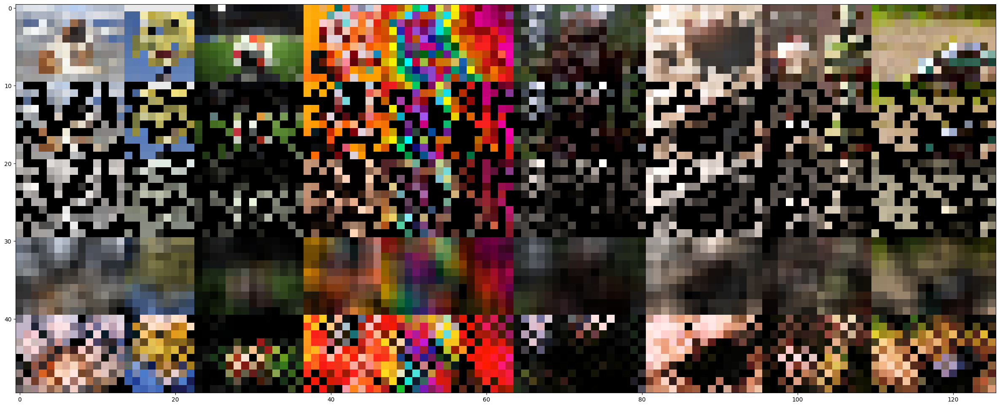

In [18]:
tests = [x for x in os.listdir('.') if x.endswith('.jpg') or x.endswith('.png') or x.endswith('.jpeg')]
max_h = 80
conorm_fn = prod
noise_level = 0.5

def test_and_compare(tests, max_h, noise_level, conorm_fn):
    vstacks = []
    for t in tqdm(tests):
        # Read and resize image
        img = read_rgb(t)
        size_h = max_h
        coeff = img.shape[1]/img.shape[0]
        size_w = int(size_h * coeff)
        img = resize(img, size=(size_w, size_h))

        # Introduce noise
        noise = np.random.random(size=(img.shape[0], img.shape[1]))
        mask = noise < noise_level
        noisy = img.copy()
        noisy[mask, :] = (0, 0, 0)

        # Denoise openCV 
        denoised_nlmeans = cv2.fastNlMeansDenoisingColored(noisy,None,20,20,7,21) 

        # Denoise gaussian (blur)
        denoised_blur = blur(noisy)

        # Denoised with fuzzy logic
        denoised_fuzzy = fuzzy_denoise(noisy, conorm_fn=conorm_fn)
        vstack = np.vstack([img, noisy, denoised_nlmeans, denoised_blur, denoised_fuzzy])
        vstacks.append(vstack)

    grid = np.hstack(vstacks)
    return grid

grid = test_and_compare(tests, max_h, noise_level, conorm_fn)
show_rgb(grid, figsize=(30, 30))

#### Resolution check

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [01:25<00:00, 42.74s/it]


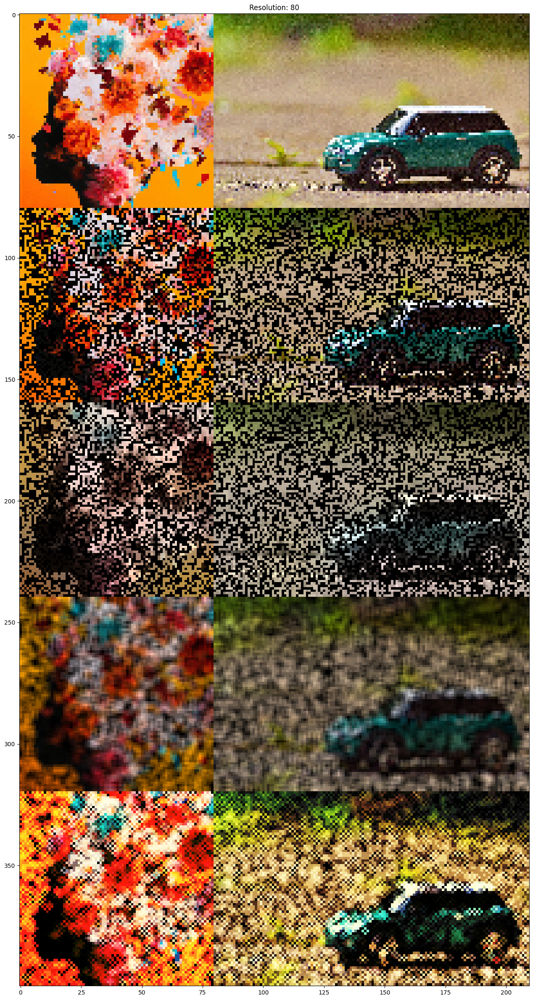

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [03:15<00:00, 97.52s/it]


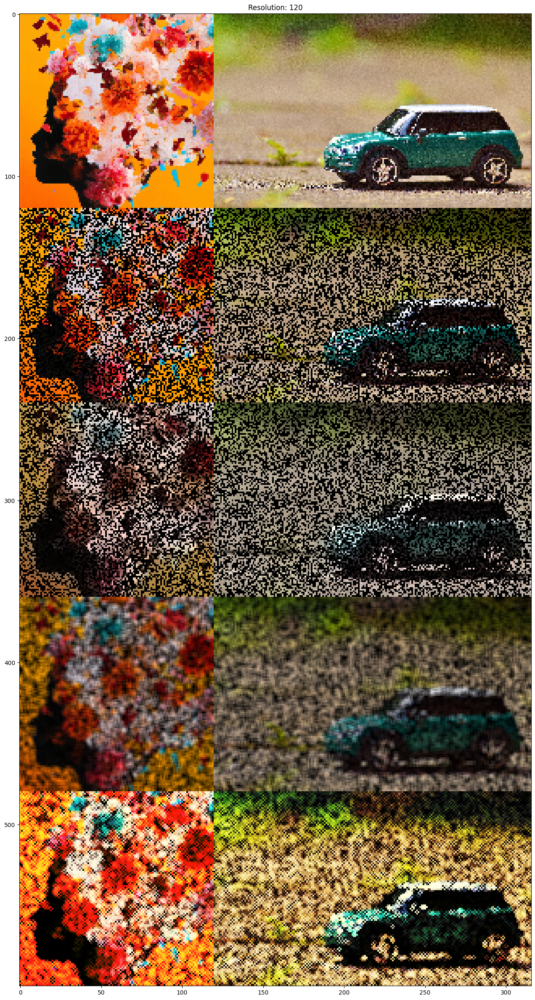

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [05:44<00:00, 172.24s/it]


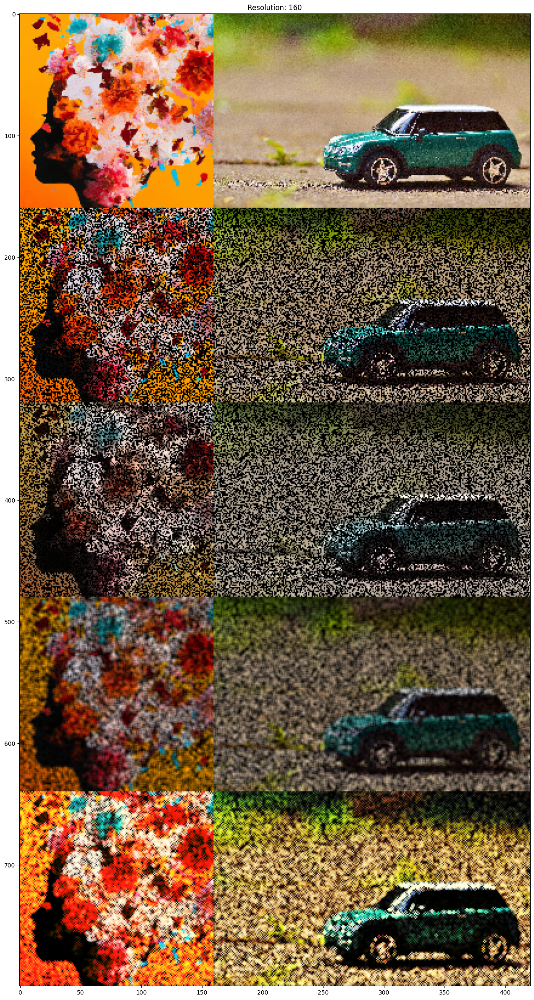

In [810]:
resolution_tests = [tests[3], tests[-1]]
for r in [80, 120, 160]:
    grid_r = test_and_compare(resolution_tests, r, 0.5, prod)
    show_rgb(grid_r, title=f'Resolution: {r}', figsize=(20, 30))

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [13:06<00:00, 393.01s/it]


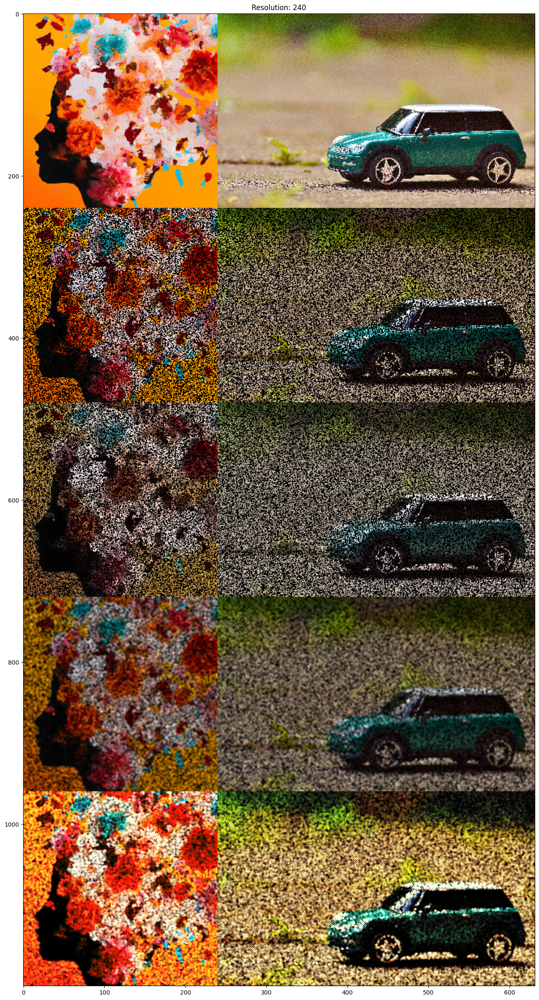

 50%|██████████████████████████████████████████████████████████████████████████████████████                                                                                      | 1/2 [19:55<19:55, 1195.57s/it]

In [ ]:
resolution_tests = [tests[3], tests[-1]]
for r in [240, 480]:
    grid_r = test_and_compare(resolution_tests, r, 0.5, prod)
    show_rgb(grid_r, title=f'Resolution: {r}', figsize=(20, 30))

In [617]:
# # Gaussian stuff
# import scipy.stats
# from scipy.stats import norm

# def gauss(x, color_intensity):
#     m = 0.5
#     epsilon = 1e-1
#     sigma = (1 - (color_intensity-epsilon)/255)**3
    
#     a = np.e**(-1*(((x-m)**2)/(2*(sigma**2))))
#     b = sigma * np.sqrt(2*np.pi)
#     pdf_y = a/b
    
#     ts = []
#     for i in np.arange(0.0, 1.01, 0.01):
#         ts.append(gauss_2(i, sigma, color_intensity))
#     m = np.array(ts).sum()

#     pmf_y = pdf_y/m
#     return pmf_y

# def gauss_2(x, sigma, color_intensity):
#     epsilon=1e-1
#     return norm.pdf(x, 0.5, sigma)

# from tqdm import tqdm
# %%time
# # Gauss-mine
# ts = []
# xs = np.arange(0.0, 1.01, 0.01)
# for i in xs:
#     t = gauss(i, 230)
#     ts.append(t)
# plt.plot(xs, ts)

# maxes = []
# intensities = range(0, 256)
# for intensity in tqdm(range(0, 256)):
#     ts = []
#     xs = np.arange(0.0, 1.01, 0.01)
#     for i in xs:
#         t = gauss(i, intensity)
#         ts.append(t)
#     maxes.append(max(ts))

# plt.plot(intensities, maxes)

# # r1 = FuzzyColor((255, 0, 0), tri)
# r2 = FuzzyColor((200, 200, 200), gauss)
# show(r2)